# OSO Airfoils — Postprocessing Plotting Examples

This notebook demonstrates all available plotting modes:

| # | Function | Description |
|---|----------|-------------|
| 1 | `polars_compare` | Fixed-colour polars comparison from pre-loaded data |
| 2 | `polars_rainbow` | Turbo-rainbow polars from pre-loaded data |
| 3 | `boundary_layer_compare` | BL comparison from pre-loaded data |
| 4 | `boundary_layer_rainbow` | BL rainbow from pre-loaded data |
| 5 | `run_and_plot_polars_compare` | Runner: fetch-or-compute + compare plot |
| 6 | `run_and_plot_polars_rainbow` | Runner: fetch-or-compute + rainbow + reference airfoil |
| 7 | `run_and_plot_boundary_layer_compare` | Runner: fetch-or-compute + BL compare |
| 8 | `run_and_plot_boundary_layer_rainbow` | Runner: fetch-or-compute + BL rainbow + reference airfoil |
| 9 | `boundary_layer_rainbow` | BL rainbow: α sweep for a single airfoil |
| 10 | Kulfan k₀ perturbation study | FFA-W3-241 upper k₀ ±20 % in 1 % steps, bwr rainbow |


## 0 — Imports & shared setup

In [2]:
import copy
import pathlib

import matplotlib
import matplotlib.pyplot as plt
import numpy as np

# oso-airfoils public API
from oso_airfoils.core import load_runs, find_record
from oso_airfoils.postprocessing import (
    polars_compare,
    polars_rainbow,
    boundary_layer_compare,
    boundary_layer_rainbow,
    run_and_plot_polars_compare,
    run_and_plot_polars_rainbow,
    run_and_plot_boundary_layer_compare,
    run_and_plot_boundary_layer_rainbow,
)
from oso_airfoils.postprocessing.runners import _find_stem_in_tree, _DEFAULT_AFL_ROOT as _AFL_ROOT
from oso_airfoils.geometry.kulfan import Kulfan

# convenience: load a Kulfan by unique airfoil name (auto-resolves family)
def load_kulfan(name: str) -> Kulfan:
    family, stem = _find_stem_in_tree(name, None)
    afl = Kulfan()
    afl.readFile(str(_AFL_ROOT / family / 'datfiles' / f'{stem}.dat'))
    return afl

# inline record-builder for NeuralFoil iterable output
def _nf_raw_to_records(raw: dict) -> list[dict]:
    alphas = np.asarray(raw['alpha'])
    cp_data = raw.get('cp_data')
    bl_data = raw.get('bl_data')
    recs = []
    for i, a in enumerate(alphas):
        recs.append({
            'source': 'neuralfoil', 'alpha': float(a),
            'cl': float(raw['cl'][i]), 'cd': float(raw['cd'][i]), 'cdp': None,
            'cm': float(raw['cm'][i]), 'cpmin': float(raw['cpmin'][i]),
            'xtr_top': float(raw['xtr_top'][i]), 'xtr_bot': float(raw['xtr_bot'][i]),
            'xtp_top': float(raw['xtp_top']), 'xtp_bot': float(raw['xtp_bot']),
            'Re': float(raw['Re']), 'M': 0.0, 'N_crit': float(raw['N_crit']),
            'N_panels': None, 'stagnation_index': None, 'stagnation_x': None,
            'model': None, 'version': None, 'f0': None,
            'chord_to_radius_ratio': None, 'drag_model': None,
            'cp_data': (cp_data[i] if cp_data is not None else None),
            'bl_data': (bl_data[i] if bl_data is not None else None),
        })
    return recs

matplotlib.rcParams['text.usetex'] = True
print('Imports OK')

Imports OK


---
## Example 1 — `polars_compare` (from pre-loaded data)

Three 24 % airfoils (FFA-W3-241, OSO-2025-WT2-T24, OSO-2026-WT2S-T24), Re = 10 M, clean + rough, XFoil.

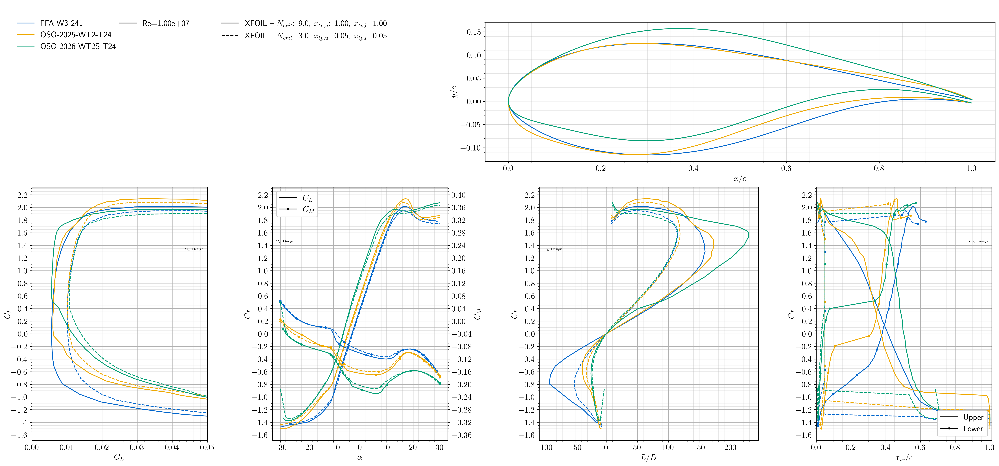

In [2]:
_24PCT_PAIRS = [
    ('ffa',           'FFA-W3-241'),
    ('oso_2025_wt2',  'OSO-2025-WT2-T24'),
    ('oso_2026_wt2s', 'OSO-2026-WT2S-T24'),
]

_data_ex1 = {stem: load_runs(fam, stem) for fam, stem in _24PCT_PAIRS}
_geom_ex1 = {stem: load_kulfan(stem) for fam, stem in _24PCT_PAIRS}

fig1 = polars_compare(
    _data_ex1,
    reynolds_numbers=[10e6],
    turb_cases=[[9.0, 1.0, 1.0], [3.0, 0.05, 0.05]],
    tools=['xfoil'],
    figure_path=None,
    geometry_dict=_geom_ex1,
    show_cpmin=False,
    cl_design=1.4,
)

---
## Example 2 — `polars_rainbow` (from pre-loaded data)

OSO-2025-WT2 thickness family (T21 → T36), Re = 10 M, clean, XFoil.  Turbo colourmap.

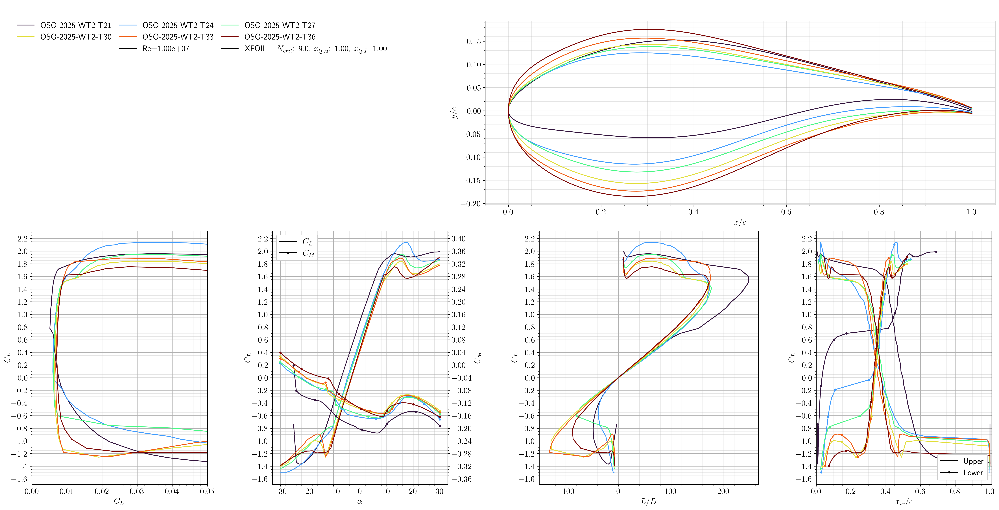

In [4]:
_WT2_STEMS = ['OSO-2025-WT2-T21', 'OSO-2025-WT2-T24', 'OSO-2025-WT2-T27',
              'OSO-2025-WT2-T30', 'OSO-2025-WT2-T33', 'OSO-2025-WT2-T36']

_data_ex2 = {s: load_runs('oso_2025_wt2', s) for s in _WT2_STEMS}
_geom_ex2 = {s: load_kulfan(s) for s in _WT2_STEMS}

fig2 = polars_rainbow(
    _data_ex2,
    reynolds_numbers=[10e6],
    turb_cases=[[9.0, 1.0, 1.0]],
    tools=['xfoil'],
    figure_path=None,
    geometry_dict=_geom_ex2,
    show_cpmin=False,
    cl_design=None,
)

---
## Example 3 — `boundary_layer_compare` (from pre-loaded data)

OSO-2025-WT2-T24 at α = 5°, Re = 10 M.  Left: clean (Ncrit = 9).  Right: rough (Ncrit = 3, xtp = 0.05).

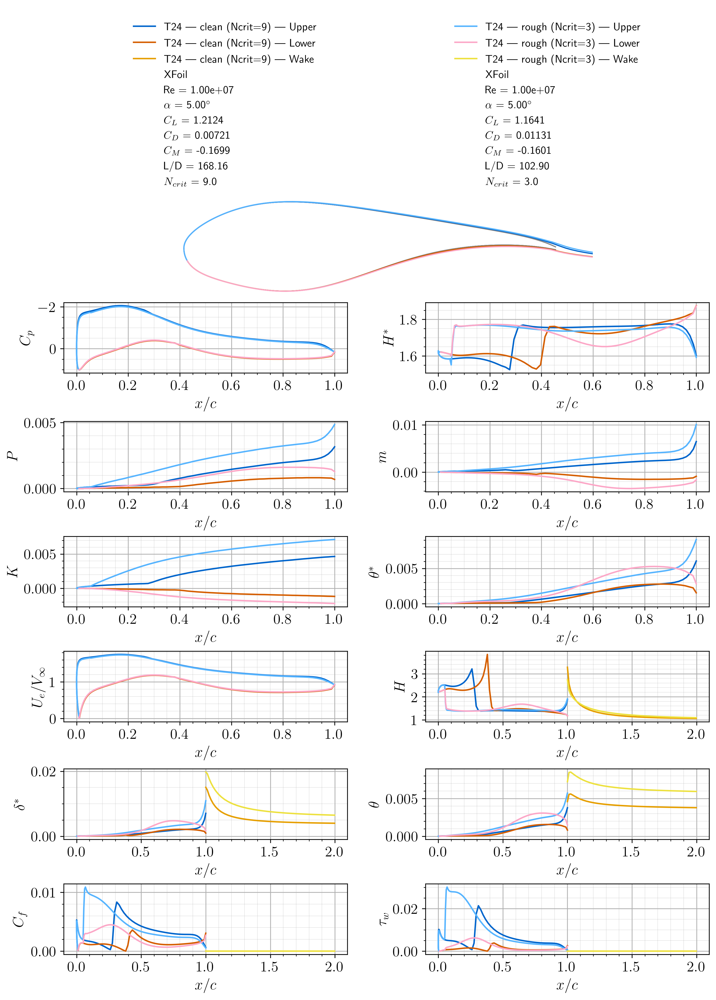

In [5]:
_rec_clean = find_record('oso_2025_wt2', 'OSO-2025-WT2-T24',
                         alpha=5.0, Re=10e6, N_crit=9.0,
                         xtp_top=1.0, xtp_bot=1.0, source='xfoil', require_bl=True)
_rec_rough = find_record('oso_2025_wt2', 'OSO-2025-WT2-T24',
                         alpha=5.0, Re=10e6, N_crit=3.0,
                         xtp_top=0.05, xtp_bot=0.05, source='xfoil', require_bl=True)

fig3 = boundary_layer_compare(
    {'T24 — clean (Ncrit=9)': [_rec_clean],
     'T24 — rough (Ncrit=3)': [_rec_rough]},
    parameter=None,
    show_airfoil=True,
    figure_path=None,
)

---
## Example 4 — `boundary_layer_rainbow` (from pre-loaded data)

OSO-2025-WT2 thickness family at α = 5°, Re = 10 M, clean, XFoil.

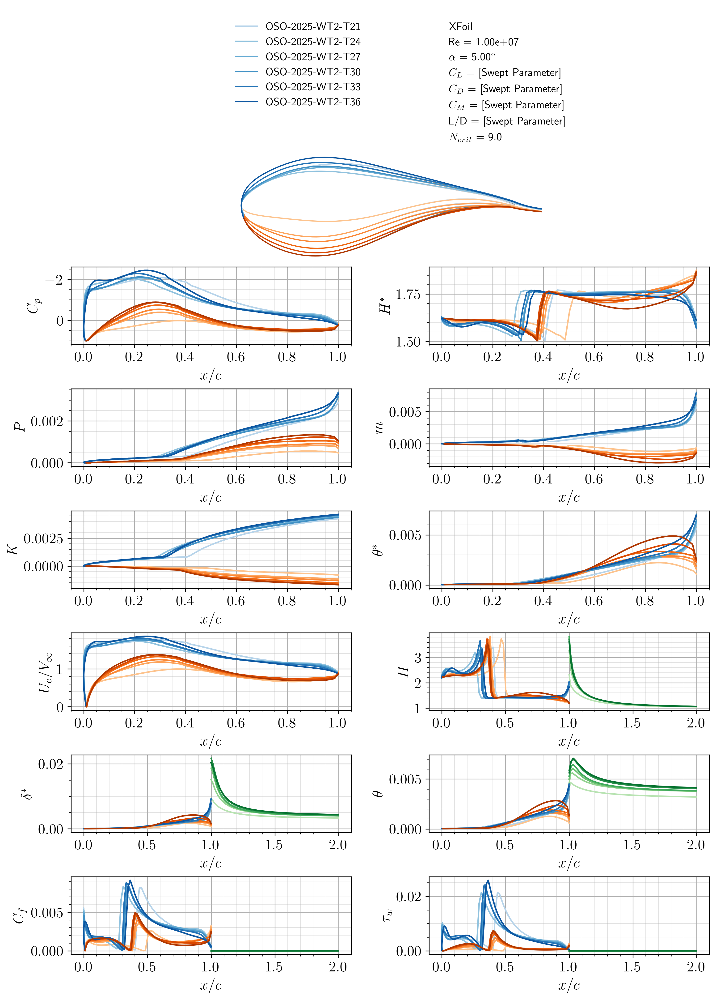

In [6]:
_data_ex4 = {}
for _s in _WT2_STEMS:
    _r = find_record('oso_2025_wt2', _s,
                     alpha=5.0, Re=10e6, N_crit=9.0,
                     xtp_top=1.0, xtp_bot=1.0, source='xfoil', require_bl=True)
    _data_ex4[_s] = [_r]

fig4 = boundary_layer_rainbow(
    _data_ex4,
    parameter=None,
    show_airfoil=True,
    figure_path=None,
)

---
## Example 5 — `run_and_plot_polars_compare` (runner)

Same three 24 % airfoils, Re = 10 M, clean + rough, XFoil.  The runner checks the JSON cache first and computes only what is missing.

  Computing FFA-W3-241  Re=1.60e+07  Ncrit=9.0  xtp=1.0/1.0  [xfoil]...
  Computing FFA-W3-241  Re=1.60e+07  Ncrit=3.0  xtp=0.05/0.05  [xfoil]...


timelimit: sending warning signal 15


  Computing OSO-2025-WT2-T24  Re=1.60e+07  Ncrit=9.0  xtp=1.0/1.0  [xfoil]...
  Computing OSO-2025-WT2-T24  Re=1.60e+07  Ncrit=3.0  xtp=0.05/0.05  [xfoil]...


timelimit: sending warning signal 15
timelimit: sending warning signal 15


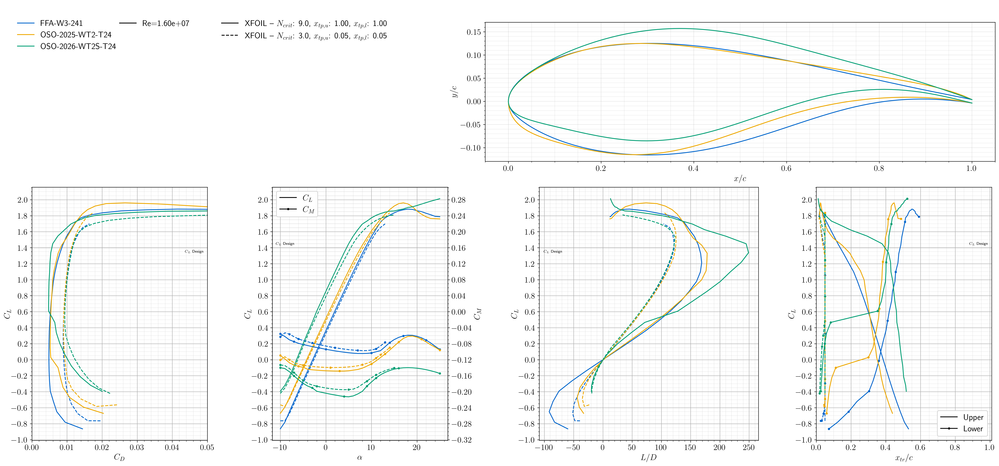

In [2]:
fig5 = run_and_plot_polars_compare(
    airfoils=[
        'FFA-W3-241',                                       # name → auto-resolved
        'OSO-2025-WT2-T24',                                 # name → auto-resolved
        ['OSO-2026-WT2S-T24', load_kulfan('OSO-2026-WT2S-T24')],  # [name, Kulfan] → always computed
    ],
    reynolds_numbers=[16e6],
    turb_cases=[[9.0, 1.0, 1.0], [3.0, 0.05, 0.05]],
    tools=['xfoil'],
    figure_path=None,
    sweep_param='alpha',
    sweep_range=list(range(-10, 26)),
    load_geometry=True,
    save_data=False,
    show_cpmin=False,
    cl_design=1.4,
)

---
## Example 6 — `run_and_plot_polars_rainbow` with reference airfoil (runner)

OSO-2025-WT2 thickness family rainbow, Re = 10 M, clean, XFoil.  FFA-W3-241 overlaid in black as the reference.

  Computing FFA-W3-241  Re=1.60e+07  Ncrit=9.0  xtp=1.0/1.0  [xfoil]...
  Computing OSO-2025-WT2-T24  Re=1.60e+07  Ncrit=9.0  xtp=1.0/1.0  [xfoil]...
  Computing du_91-w2-250  Re=1.60e+07  Ncrit=9.0  xtp=1.0/1.0  [xfoil]...


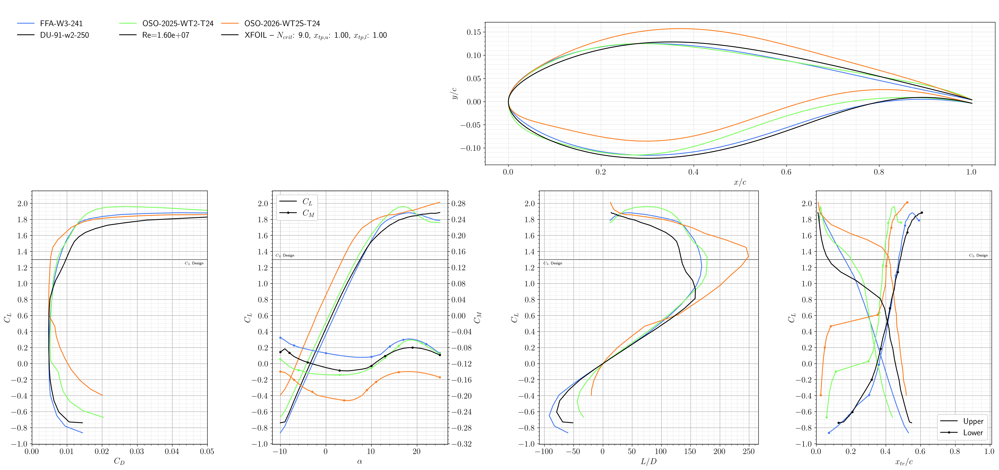

In [2]:
fig6 = run_and_plot_polars_rainbow(
    airfoils=[
        'FFA-W3-241',                                       # name → auto-resolved
        'OSO-2025-WT2-T24',                                 # name → auto-resolved
        ['OSO-2026-WT2S-T24', load_kulfan('OSO-2026-WT2S-T24')],  # [name, Kulfan] → always computed
    ],
    reynolds_numbers=[16e6],
    turb_cases=[[9.0, 1.0, 1.0]],
    tools=['xfoil'],
    figure_path=None,
    sweep_param='alpha',
    sweep_range=list(range(-10, 26)),
    load_geometry=True,
    save_data=False,
    reference_airfoils=[('DU-91-w2-250', 'k')],
    show_cpmin=False,
    cl_design=1.3,
)

---
## Example 7 — `run_and_plot_boundary_layer_compare` (runner)

OSO-2025-WT2-T24 at Re = 10 M: clean at α = 5°, rough at C_L = 1.2.  Each entry specifies its own flight condition via `'alpha'` or `'cl'`.


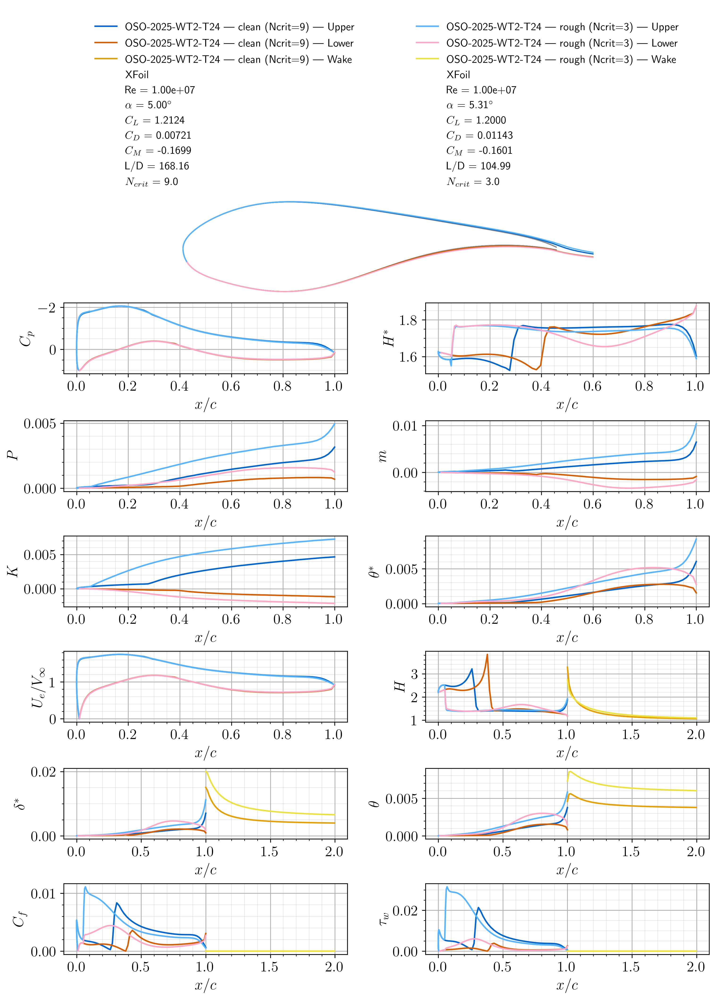

In [2]:
fig7 = run_and_plot_boundary_layer_compare(
    airfoils={
        'OSO-2025-WT2-T24 — clean (Ncrit=9)': {
            'airfoil': 'OSO-2025-WT2-T24',
            'alpha': 5.0, 'Re': 10e6, 'N_crit': 9.0,
            'xtp_top': 1.0, 'xtp_bot': 1.0, 'tool': 'xfoil',
        },
        'OSO-2025-WT2-T24 — rough (Ncrit=3)': {
            'airfoil': load_kulfan('OSO-2025-WT2-T24'),
            'cl': 1.2, 'Re': 10e6, 'N_crit': 3.0,
            'xtp_top': 0.05, 'xtp_bot': 0.05, 'tool': 'xfoil',
        },
    },
    figure_path=None,
    save_data=False,
    show_airfoil=True,
)


---
## Example 8 — `run_and_plot_boundary_layer_rainbow` with reference airfoil (runner)

OSO-2025-WT2 thickness family BL rainbow at α = 5°, Re = 10 M, clean, XFoil.  FFA-W3-241 drawn in black on top.

  Computing BL for FFA-W3-241  alpha=5.0  Re=1.60e+07  Ncrit=9.0  [xfoil]...
  Computing BL for riso-b-23  alpha=5.0  Re=1.60e+07  Ncrit=9.0  [xfoil]...


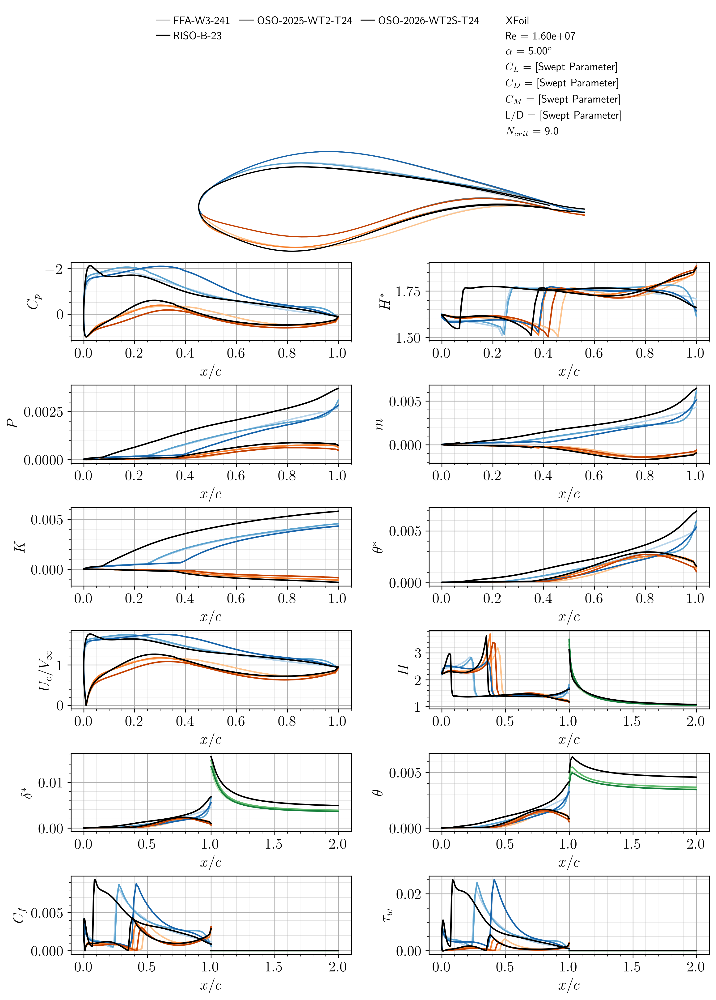

In [2]:
fig8 = run_and_plot_boundary_layer_rainbow(
    airfoils=[
        'FFA-W3-241',                                       # name → auto-resolved
        'OSO-2025-WT2-T24',                                 # name → auto-resolved
        ['OSO-2026-WT2S-T24', load_kulfan('OSO-2026-WT2S-T24')],  # [name, Kulfan] → always computed
    ],
    alpha=5.0,
    Re=16e6,
    N_crit=9.0,
    xtp_top=1.0,
    xtp_bot=1.0,
    source='xfoil',
    figure_path=None,
    save_data=False,
    reference_airfoils=[('riso-b-23', 'k')],
    show_airfoil=True,
)

---
## Example 9 — `boundary_layer_rainbow`: α sweep for OSO-2025-WT2-T24

Single airfoil (OSO-2025-WT2-T24), Re = 16 M, clean (Ncrit = 9), XFoil.  α swept from −5° to 25° in 1° steps.


Imports OK
  Computing BL for OSO-2025-WT2-T24  alpha=7.0  Re=1.60e+07  Ncrit=9.0  [xfoil]...
  Computing BL for OSO-2025-WT2-T24  alpha=8.0  Re=1.60e+07  Ncrit=9.0  [xfoil]...
  Computing BL for OSO-2025-WT2-T24  alpha=9.0  Re=1.60e+07  Ncrit=9.0  [xfoil]...
  Computing BL for OSO-2025-WT2-T24  alpha=10.0  Re=1.60e+07  Ncrit=9.0  [xfoil]...
  Computing BL for OSO-2025-WT2-T24  alpha=11.0  Re=1.60e+07  Ncrit=9.0  [xfoil]...
  Computing BL for OSO-2025-WT2-T24  alpha=12.0  Re=1.60e+07  Ncrit=9.0  [xfoil]...
  Computing BL for OSO-2025-WT2-T24  alpha=13.0  Re=1.60e+07  Ncrit=9.0  [xfoil]...
  Computing BL for OSO-2025-WT2-T24  alpha=14.0  Re=1.60e+07  Ncrit=9.0  [xfoil]...


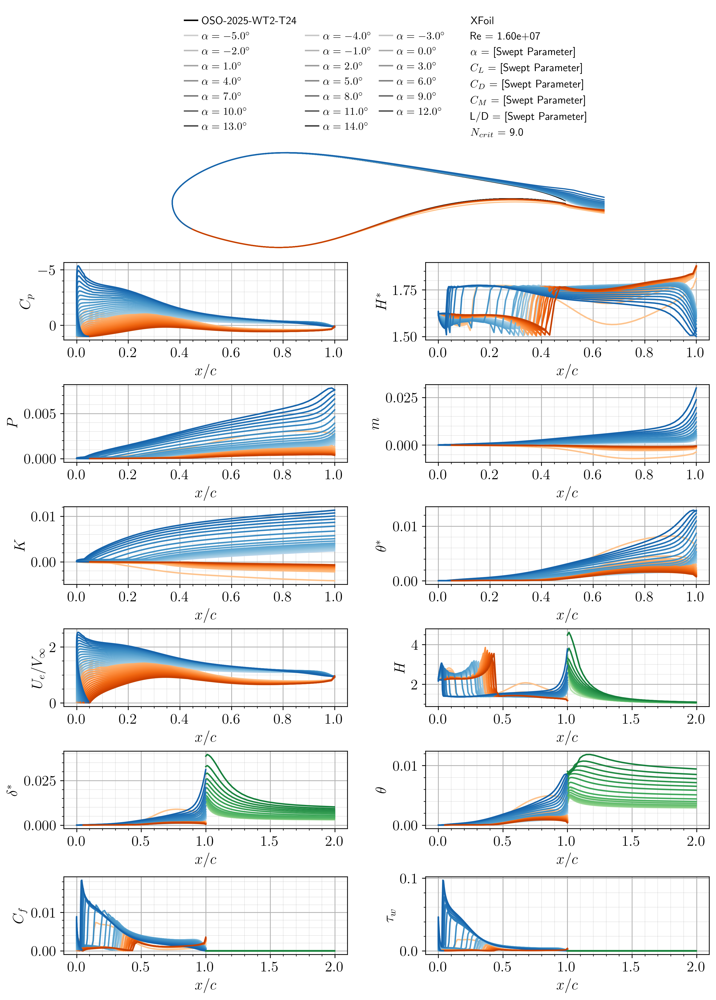

In [ ]:
fig9 = run_and_plot_boundary_layer_rainbow(
    airfoils=['OSO-2025-WT2-T24'],
    alpha=list(range(-5, 15)),
    Re=16e6,
    N_crit=9.0,
    xtp_top=1.0,
    xtp_bot=1.0,
    source='xfoil',
    figure_path=None,
    save_data=False,
    show_airfoil=True,
)


---
## Example 10 — Kulfan k₀ perturbation study (FFA-W3-241)

Upper k₀ of FFA-W3-241 scaled ±1 % per step from −20 % to +20 % (40 variants), re-normalised to τ = 0.24.  Polars via NeuralFoil (bwr rainbow, original in black).


<>:78: SyntaxWarning: invalid escape sequence '\%'
<>:78: SyntaxWarning: invalid escape sequence '\%'
/tmp/ipykernel_92250/2688245737.py:78: SyntaxWarning: invalid escape sequence '\%'
  variants[f'$K_l$[{coeff_idx}] {pct:+d}\%'] = afl_v


Imports OK


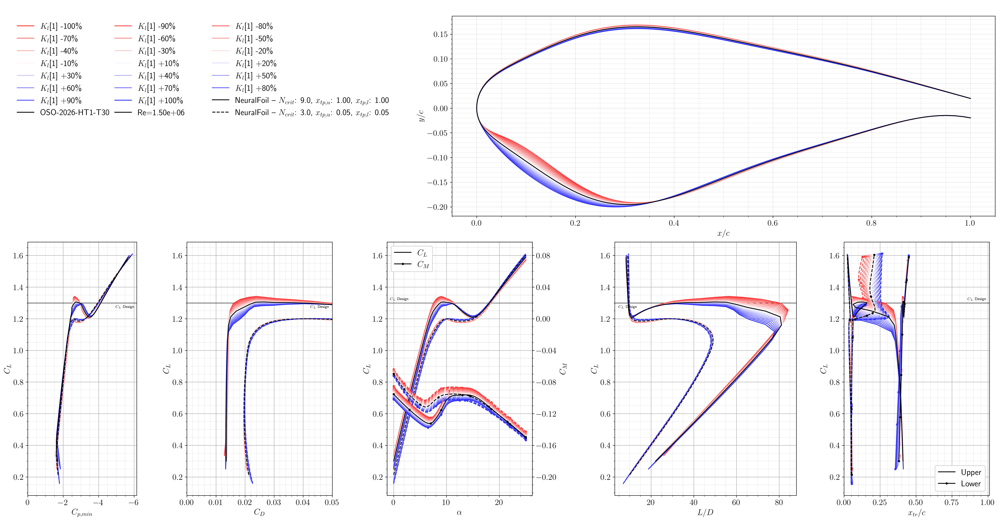

In [10]:
import copy
import pathlib

import matplotlib
import matplotlib.pyplot as plt
import numpy as np

# oso-airfoils public API
from oso_airfoils.core import load_runs, find_record
from oso_airfoils.postprocessing import (
    polars_compare,
    polars_rainbow,
    boundary_layer_compare,
    boundary_layer_rainbow,
    run_and_plot_polars_compare,
    run_and_plot_polars_rainbow,
    run_and_plot_boundary_layer_compare,
    run_and_plot_boundary_layer_rainbow,
)
from oso_airfoils.postprocessing.runners import _find_stem_in_tree, _DEFAULT_AFL_ROOT as _AFL_ROOT
from oso_airfoils.geometry.kulfan import Kulfan

# convenience: load a Kulfan by unique airfoil name (auto-resolves family)
def load_kulfan(name: str) -> Kulfan:
    family, stem = _find_stem_in_tree(name, None)
    afl = Kulfan()
    afl.readFile(str(_AFL_ROOT / family / 'datfiles' / f'{stem}.dat'))
    return afl

# inline record-builder for NeuralFoil iterable output
def _nf_raw_to_records(raw: dict) -> list[dict]:
    alphas = np.asarray(raw['alpha'])
    cp_data = raw.get('cp_data')
    bl_data = raw.get('bl_data')
    recs = []
    for i, a in enumerate(alphas):
        recs.append({
            'source': 'neuralfoil', 'alpha': float(a),
            'cl': float(raw['cl'][i]), 'cd': float(raw['cd'][i]), 'cdp': None,
            'cm': float(raw['cm'][i]), 'cpmin': float(raw['cpmin'][i]),
            'xtr_top': float(raw['xtr_top'][i]), 'xtr_bot': float(raw['xtr_bot'][i]),
            'xtp_top': float(raw['xtp_top']), 'xtp_bot': float(raw['xtp_bot']),
            'Re': float(raw['Re']), 'M': 0.0, 'N_crit': float(raw['N_crit']),
            'N_panels': None, 'stagnation_index': None, 'stagnation_x': None,
            'model': None, 'version': None, 'f0': None,
            'chord_to_radius_ratio': None, 'drag_model': None,
            'cp_data': (cp_data[i] if cp_data is not None else None),
            'bl_data': (bl_data[i] if bl_data is not None else None),
        })
    return recs

matplotlib.rcParams['text.usetex'] = True
print('Imports OK')





import copy

# ── Load baseline and scale to τ = 0.24 ──────────────────────────────────────
afl_ffa = load_kulfan('OSO-2026-HT1-T36')
# afl_ffa.scaleThickness(0.24)                 # reference is also τ = 0.24
afl_ffa.changeOrder(12)

coeff_idx = 1
k0_orig = float(afl_ffa.lowerCoefficients.magnitude[coeff_idx])
_unit   = afl_ffa.lowerCoefficients.units

# ── Build perturbed Kulfan variants (2 % steps) ───────────────────────────────
variants = {}
for pct in list(range(-100, 0, 10)) + list(range(10, 110, 10)):
    afl_v = copy.deepcopy(afl_ffa)
    coef = afl_v.lowerCoefficients.magnitude.copy()
    coef[coeff_idx] = k0_orig * (1.0 + pct / 100.0)
    afl_v.lowerCoefficients = coef * _unit
    afl_v.scaleThickness(0.36)
    variants[f'$K_l$[{coeff_idx}] {pct:+d}\%'] = afl_v

# ── Rainbow polars (bwr, scaled OSO-2026-HT1-T30 reference in black) ────────────────
fig10 = run_and_plot_polars_rainbow(
    airfoils=[[name, afl] for name, afl in variants.items()],
    reynolds_numbers=[1.5e6],
    turb_cases=[[9.0, 1.0, 1.0], [3.0, 0.05, 0.05]],
    tools=['neuralfoil'],
    figure_path=None,
    sweep_param='alpha',
    sweep_range=list(np.arange(0, 25.5, 0.5)),
    load_geometry=True,
    save_data=False,
    reference_airfoils=[['OSO-2026-HT1-T30', afl_ffa, 'k']],
    show_cpmin=True,
    cl_design=1.3,
    style={'cmap_rainbow': 'bwr_r'},
)




In [4]:
"""Cp CL-sweep plot for a reference airfoil.

Runs xfoil at a range of lift coefficients and overlays the Cp distributions
on a single inverted-axis plot, coloured by a sequential colormap so the
progression with CL is visually clear.  Specific CL values can be highlighted
with custom colours via the cl_highlights dict.
"""

from __future__ import annotations
import matplotlib
matplotlib.use('Agg')
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.lines import Line2D

from oso_airfoils.core.data_utils import _DEFAULT_AFL_ROOT
from oso_airfoils.core.xfoil_wrapper import run as xfoil_run
from oso_airfoils.postprocessing.runners import _find_stem_in_tree, _load_kulfan
from oso_airfoils.postprocessing.polars import get_colors

plt.rcParams['text.usetex'] = True
plt.rcParams.update({'font.size': 13})

DEFAULT_RE      = 3e6
DEFAULT_N_CRIT  = 9.0
DEFAULT_XTP     = 1.0
DEFAULT_CMAP    = 'coolwarm'
_CMAP_LOWER     = 0.30
_CMAP_UPPER     = 0.80


def _plot_cp_split(ax, cp_data: dict, color,
                   linewidth: float = 1.4, line_alpha: float = 0.85) -> None:
    cp   = cp_data['cp']
    x    = cp_data['x']
    stag = cp.index(max(cp))
    ax.plot(x[:stag + 1], cp[:stag + 1], color=color, linewidth=linewidth, alpha=line_alpha)
    ax.plot(x[stag:],     cp[stag:],     color=color, linewidth=linewidth, alpha=line_alpha)


def cp_cl_sweep(
    airfoil_name: str,
    cls: list[float],
    Re: float = DEFAULT_RE,
    N_crit: float = DEFAULT_N_CRIT,
    xtp_u: float = DEFAULT_XTP,
    xtp_l: float = DEFAULT_XTP,
    cmap_name: str = DEFAULT_CMAP,
    cl_highlights: dict | None = None,
    figure_path: str | None = None,
    dpi: int = 300,
) -> 'matplotlib.figure.Figure':
    """
    cl_highlights : dict mapping CL value -> colour string, e.g.
                    {0.8: 'tab:green', 1.2: 'tab:orange'}
                    Overrides the colormap colour for those specific CL values.
    """
    family, stem = _find_stem_in_tree(airfoil_name, _DEFAULT_AFL_ROOT)
    afl = _load_kulfan(family, stem, _DEFAULT_AFL_ROOT)
    print(f'Loaded: {stem}  (family={family})')

    te_gap = float(afl.constants.TE_gap)

    # Colormap: clipped exactly as BL rainbow plots (lower=0.30, upper=0.80)
    n      = len(cls)
    colors = get_colors(n, cmap_name, lower=_CMAP_LOWER, upper=_CMAP_UPPER)

    fig, (ax_cp, ax_afl) = plt.subplots(
        2, 1, figsize=(10, 8), dpi=dpi,
        gridspec_kw={'height_ratios': [3, 1]},
    )

    xlims  = (-0.05, 1.05)
    tick_h = 0.04

    ax_cp.plot(xlims, [0, 0], color='k', linewidth=0.7)
    for xt in np.linspace(0, 1, 11):
        ax_cp.plot([xt, xt], [-tick_h, tick_h], color='k', linewidth=0.5)
    ax_cp.set_xlim(xlims)
    ax_cp.set_ylabel(r'$C_p$')
    ax_cp.spines[['right', 'top', 'bottom']].set_visible(False)
    ax_cp.set_xticks([])

    all_cp_min: list[float] = []
    converged_cls: list[float] = []
    converged_colors: list = []

    for i, cl_target in enumerate(cls):
        # resolve colour: highlight override takes priority over colormap
        color = colors[i]
        if cl_highlights:
            for hcl, hcolor in cl_highlights.items():
                if abs(cl_target - hcl) < 1e-9:
                    color = hcolor
                    break

        print(f'  Running CL={cl_target:.3f}...')
        res = xfoil_run(
            'cl',
            afl.upperCoefficients, afl.lowerCoefficients,
            val=cl_target,
            Re=Re, N_crit=N_crit, xtp_u=xtp_u, xtp_l=xtp_l,
            TE_gap=te_gap, timelimit=20,
            save_boundary_layer_data=True,
        )
        if res is None:
            print(f'    → xfoil returned None, skipping.')
            continue
        cp_data = res.get('cp_data')
        if cp_data is None or not cp_data.get('cp'):
            print(f'    → no cp_data, skipping.')
            continue

        _plot_cp_split(ax_cp, cp_data, color=color)
        all_cp_min.append(min(cp_data['cp']))
        converged_cls.append(cl_target)
        converged_colors.append(color)

    if not converged_cls:
        print('No converged solutions — nothing to plot.')
        plt.close(fig)
        return fig

    cp_floor = min(all_cp_min) - 0.1
    ax_cp.set_ylim([min(-2.0, cp_floor), 1.1])
    ax_cp.invert_yaxis()

    # BL-style legend: explicit Line2D handles, upper right
    handles = [
        Line2D([0], [0], color=c, linewidth=1.4,
               label=rf'$C_L={cl:.3f}$')
        for c, cl in zip(converged_colors, converged_cls)
    ]
    ax_cp.legend(handles=handles, fontsize=8, loc='upper right', ncols=2,
                 framealpha=0.7, handlelength=1.2)

    cond = (f'$N_{{cr}}={N_crit:.0f}$, '
            + (r'$x_{tp}=1$' if xtp_u >= 1.0 else rf'$x_{{tp}}={xtp_u:.2f}$')
            + f',  $Re={Re:.2e}$')
    ax_cp.set_title(
        rf'	{{{stem.replace("_", "-")}}}  —  $C_p$ vs $C_L$  ({cond})',
        fontsize=12,
    )

    ax_afl.plot(afl.xcoordinates, afl.ycoordinates, 'k', linewidth=1.0)
    ax_afl.set_xlim(xlims)
    ax_afl.set_aspect('equal')
    ax_afl.set_xticks([])
    ax_afl.set_yticks([])
    ax_afl.spines[['right', 'left', 'top', 'bottom']].set_visible(False)
    ax_afl.set_xlabel(r'$x/c$')

    plt.tight_layout()

    if figure_path is not None:
        fig.savefig(figure_path, dpi=dpi, bbox_inches='tight')
        print(f'Saved → {figure_path}')

    return fig


n_crit = 9.0
xtp_u  = 1.0
xtp_l  = 1.0

cls = np.linspace(0.0, 1.5, 16)

airfoils = ['mhkf1-180', 'mhkf1-240']

for airfoil in airfoils:
    figure_path = f'/Users/codykarcher/Desktop/{airfoil}_cp_cl_sweep.png'
    cp_cl_sweep(
        airfoil_name=airfoil,
        cls=cls,
        Re=1.5e6,
        N_crit=n_crit,
        xtp_u=xtp_u,
        xtp_l=xtp_l,
        cmap_name='Blues',
        cl_highlights={1.3: 'tab:green'},
        figure_path=figure_path,
        dpi=200,
    )


Loaded: mhkf1-180  (family=mhkf1)
  Running CL=0.000...
  Running CL=0.100...
  Running CL=0.200...
  Running CL=0.300...
  Running CL=0.400...
  Running CL=0.500...
  Running CL=0.600...
  Running CL=0.700...
  Running CL=0.800...
  Running CL=0.900...
  Running CL=1.000...
  Running CL=1.100...
  Running CL=1.200...
  Running CL=1.300...
  Running CL=1.400...
  Running CL=1.500...
Saved → /Users/codykarcher/Desktop/mhkf1-180_cp_cl_sweep.png
Loaded: mhkf1-240  (family=mhkf1)
  Running CL=0.000...
  Running CL=0.100...
  Running CL=0.200...
  Running CL=0.300...
  Running CL=0.400...
  Running CL=0.500...
  Running CL=0.600...
  Running CL=0.700...
  Running CL=0.800...
  Running CL=0.900...
  Running CL=1.000...
  Running CL=1.100...
  Running CL=1.200...
  Running CL=1.300...
  Running CL=1.400...
  Running CL=1.500...
Saved → /Users/codykarcher/Desktop/mhkf1-240_cp_cl_sweep.png


---
## Example 11 — `run_and_plot_polars_compare`: MHKF1 18 % vs 24 %

MHKF1-180 (blue) and MHKF1-240 (green), Re = 1.5 M, clean (Ncrit = 9), XFoil.


Imports OK
  Computing mhkf1-240  Re=1.50e+06  Ncrit=9.0  xtp=1.0/1.0  [xfoil]  (29/29 values missing)...
  Computing mhkf1-240  Re=1.50e+06  Ncrit=3  xtp=0.05/0.05  [xfoil]  (29/29 values missing)...


timelimit: sending warning signal 15


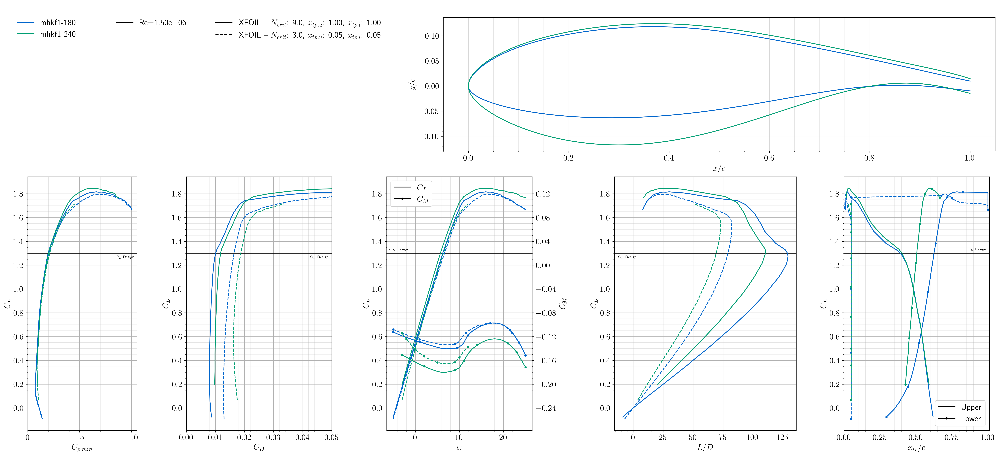

In [7]:
from oso_airfoils.core.colors import default_color_cycle as dcc


import copy
import pathlib

import matplotlib
import matplotlib.pyplot as plt
import numpy as np

# oso-airfoils public API
from oso_airfoils.core import load_runs, find_record
from oso_airfoils.postprocessing import (
    polars_compare,
    polars_rainbow,
    boundary_layer_compare,
    boundary_layer_rainbow,
    run_and_plot_polars_compare,
    run_and_plot_polars_rainbow,
    run_and_plot_boundary_layer_compare,
    run_and_plot_boundary_layer_rainbow,
)
from oso_airfoils.postprocessing.runners import _find_stem_in_tree, _DEFAULT_AFL_ROOT as _AFL_ROOT
from oso_airfoils.geometry.kulfan import Kulfan

# convenience: load a Kulfan by unique airfoil name (auto-resolves family)
def load_kulfan(name: str) -> Kulfan:
    family, stem = _find_stem_in_tree(name, None)
    afl = Kulfan()
    afl.readFile(str(_AFL_ROOT / family / 'datfiles' / f'{stem}.dat'))
    return afl

# inline record-builder for NeuralFoil iterable output
def _nf_raw_to_records(raw: dict) -> list[dict]:
    alphas = np.asarray(raw['alpha'])
    cp_data = raw.get('cp_data')
    bl_data = raw.get('bl_data')
    recs = []
    for i, a in enumerate(alphas):
        recs.append({
            'source': 'neuralfoil', 'alpha': float(a),
            'cl': float(raw['cl'][i]), 'cd': float(raw['cd'][i]), 'cdp': None,
            'cm': float(raw['cm'][i]), 'cpmin': float(raw['cpmin'][i]),
            'xtr_top': float(raw['xtr_top'][i]), 'xtr_bot': float(raw['xtr_bot'][i]),
            'xtp_top': float(raw['xtp_top']), 'xtp_bot': float(raw['xtp_bot']),
            'Re': float(raw['Re']), 'M': 0.0, 'N_crit': float(raw['N_crit']),
            'N_panels': None, 'stagnation_index': None, 'stagnation_x': None,
            'model': None, 'version': None, 'f0': None,
            'chord_to_radius_ratio': None, 'drag_model': None,
            'cp_data': (cp_data[i] if cp_data is not None else None),
            'bl_data': (bl_data[i] if bl_data is not None else None),
        })
    return recs

matplotlib.rcParams['text.usetex'] = True
print('Imports OK')



fig11 = run_and_plot_polars_compare(
    airfoils=['mhkf1-180', 'mhkf1-240'],
    reynolds_numbers=[1.5e6],
    turb_cases=[[9.0, 1.0, 1.0],[3, 0.05, 0.05]],
    tools=['xfoil'],
    figure_path=None,
    sweep_param='alpha',
    sweep_range=list(range(-3, 26)),
    load_geometry=True,
    save_data=False,
    show_cpmin=True,
    cl_design=1.3,
    color_override={
        'mhkf1-180': dcc.blue,
        'mhkf1-240': dcc.green,
    },
)


In [10]:
import io
import json
import re
from oso_airfoils.postprocessing.runners import _find_stem_in_tree
from oso_airfoils.core.data_utils import _DEFAULT_AFL_ROOT, _DEFAULT_PERF_ROOT
import pathlib
from ruamel.yaml import YAML
from ruamel.yaml.scalarstring import DoubleQuotedScalarString as Q
# _here = pathlib.Path(__file__).parent
_yaml = YAML()
_yaml.preserve_quotes = True
_yaml.representer.add_representer(type(None), lambda dumper, _: dumper.represent_scalar('tag:yaml.org,2002:null', 'null'))

def _column_format(yaml_str):
    """Reformat top-level key: value lines to column-aligned style."""
    lines = yaml_str.splitlines()
    _KEY_PAT = re.compile(r'^([A-Za-z_]\w*)\s*:\s*(.*)')
    matches = [_KEY_PAT.match(l) for l in lines]
    col = max((len(m.group(1)) for m in matches if m), default=0) + 1
    out = []
    for line, m in zip(lines, matches):
        if m:
            out.append(f'{m.group(1):<{col}}: {m.group(2)}')
        else:
            out.append(line)
    return '\n'.join(out) + '\n'

def load_geometry_params(airfoil_name):
    """Load geometry constraint parameters directly from the cached performance JSON.

    The family directory is resolved automatically from the airfoil name.

    Parameters
    ----------
    airfoil_name : str
        Name of the airfoil (e.g. 'mhkf1-240', 'FFA-W3-241').

    Returns
    -------
    dict with keys: tau, TE_gap, Ixx_con, Iyy_con, Izz_con, A_con,
                    ler_con_upper, ler_con_lower
    """

    family, stem = _find_stem_in_tree(airfoil_name, None)
    jpath = _DEFAULT_PERF_ROOT / family / 'performance_data' / f'{stem}.json'
    with open(jpath) as f:
        d = json.load(f)
    g = d['geometry']
    return {
        'tau'          : g['tau'],
        'TE_gap'       : g['TE_gap'],
        'Ixx_con'      : g['Ixx'],
        'Iyy_con'      : g['Iyy'],
        'Izz_con'      : g['Izz'],
        'A_con'        : g['area'],
        'ler_con_upper': g['LE_radius_upper'],
        'ler_con_lower': g['LE_radius_lower'],
    }

def linear_query(tau, x1, x2, y1, y2):
    """Simple linear interpolation/extrapolation."""
    return y1 + (y2 - y1) * (tau - x1) / (x2 - x1)

tau_data = {
    #        TE_gap      Ixx_con     Iyy_con     Izz_con     A_con       ler_con  cone_angle
    # 0.15: {'TE_gap': 0.00196,  'Ixx_con': 0.00011000, 'Iyy_con': 0.00397999, 'Izz_con': 0.00408809, 'A_con': 0.08700496, 'ler_con_upper': 0.007, 'ler_con_lower': 0.007, 'cone_angle': 10.0, 'target_cl': None, 'target_alpha': None},
    0.18: {'CL': 1.3,'TE_gap': 0.00230,  'Ixx_con': 0.00017438, 'Iyy_con': 0.00436351, 'Izz_con': 0.00454606, 'A_con': 0.09995900, 'ler_con_upper': 0.008, 'ler_con_lower': 0.008, 'cone_angle': 10.0, 'target_cl': None, 'target_alpha': None, 'percent_delta_cl_from_roughness_threshold' : 0.05, 'percent_LoD_falloff_threshold' : 0.05, 'cp_min_design' : -2.0,},
    0.21: {'CL': 1.3,'TE_gap': 0.00262,  'Ixx_con': 0.00027518, 'Iyy_con': 0.00493714, 'Izz_con': 0.00521632, 'A_con': 0.11477620, 'ler_con_upper': 0.010, 'ler_con_lower': 0.010, 'cone_angle':  5.0, 'target_cl': None, 'target_alpha': None, 'percent_delta_cl_from_roughness_threshold' : 0.05, 'percent_LoD_falloff_threshold' : 0.05, 'cp_min_design' : -2.0,},
    0.24: {'CL': 1.3,'TE_gap': 0.00751,  'Ixx_con': 0.00041096, 'Iyy_con': 0.00561409, 'Izz_con': 0.00602287, 'A_con': 0.13051205, 'ler_con_upper': 0.025, 'ler_con_lower': 0.025, 'cone_angle':  5.0, 'target_cl': None, 'target_alpha': None, 'percent_delta_cl_from_roughness_threshold' : 0.05, 'percent_LoD_falloff_threshold' : 0.05, 'cp_min_design' : -2.0,},
    0.27: {'CL': 1.3,'TE_gap': 0.01012,  'Ixx_con': 0.00058321, 'Iyy_con': 0.00633417, 'Izz_con': 0.00691323, 'A_con': 0.14660942, 'ler_con_upper': 0.030, 'ler_con_lower': 0.030, 'cone_angle':  5.0, 'target_cl':  1.6, 'target_alpha': 10.0, 'percent_delta_cl_from_roughness_threshold' : 0.10, 'percent_LoD_falloff_threshold' : 0.15, 'cp_min_design' : -2.0,},
    0.30: {'CL': 1.3,'TE_gap': 0.01140,  'Ixx_con': 0.00079640, 'Iyy_con': 0.00706380, 'Izz_con': 0.00785849, 'A_con': 0.16289864, 'ler_con_upper': 0.040, 'ler_con_lower': 0.040, 'cone_angle':  0.0, 'target_cl':  1.6, 'target_alpha': 10.0, 'percent_delta_cl_from_roughness_threshold' : 0.10, 'percent_LoD_falloff_threshold' : 0.15, 'cp_min_design' : -2.1,},
    0.33: {'CL': 1.3,'TE_gap': 0.01140,  'Ixx_con': 0.00105795, 'Iyy_con': 0.00779600, 'Izz_con': 0.00885328, 'A_con': 0.17959744, 'ler_con_upper': 0.060, 'ler_con_lower': 0.060, 'cone_angle':  0.0, 'target_cl':  1.6, 'target_alpha': 10.0, 'percent_delta_cl_from_roughness_threshold' : 0.10, 'percent_LoD_falloff_threshold' : 0.15, 'cp_min_design' : -2.3,},
    0.36: {'CL': 1.3,'TE_gap': 0.01140,  'Ixx_con': 0.00137822, 'Iyy_con': 0.00855043, 'Izz_con': 0.00991577, 'A_con': 0.19731100, 'ler_con_upper': 0.080, 'ler_con_lower': 0.080, 'cone_angle':  0.0, 'target_cl':  1.6, 'target_alpha': 10.0, 'percent_delta_cl_from_roughness_threshold' : 0.10, 'percent_LoD_falloff_threshold' : 0.15, 'cp_min_design' : -2.5,},
}

global_changes = {
    # 'cp_min_design'                                : -2.0,
    # 'cp_min_prestall'                              : -7.0,
    'N_generations'                                : 500,
}

tool_cases = {
    'neuralfoil': {
        # This is the baseline
    },
    'xfoil': {
        'tool'                                         : "xfoil",
    },
    # Alan Supercomputer, Xfoil
    'supercomputer_xfoil': {
        'tool'                                         : "xfoil",
        'xfoil_path'                                   : [Q("/gpfs/ahsieh/tempfiles/xfoil"),Q("/pscratch/ahsieh/tempfiles/xfoil"),Q("/tscratch/ahsieh/tempfiles/xfoil")],
        'xfoil_tempfile_path_leader'                   : [Q("/gpfs/ahsieh/tempfiles/tmp_") ,Q("/pscratch/ahsieh/tempfiles/tmp_") ,Q("/tscratch/ahsieh/tempfiles/tmp_") ],
        'N_tries'                                      : 3,
        'outfile_leader'                               : "./"
    },
}

mhkf1_180_geometry_params = load_geometry_params('mhkf1-180')
mhkf1_240_geometry_params = load_geometry_params('mhkf1-240')
mhkf1_400_geometry_params = load_geometry_params('mhkf1-400')

print('Geometry parameters loaded from JSON:')
print('mhkf1-180:', mhkf1_180_geometry_params)
print('mhkf1-240:', mhkf1_240_geometry_params)
print('mhkf1-400:', mhkf1_400_geometry_params)

Geometry parameters loaded from JSON:
mhkf1-180: {'tau': 0.1799999943708016, 'TE_gap': 0.019656152, 'Ixx_con': 0.0002060836481802331, 'Iyy_con': 0.005782830613670396, 'Izz_con': 0.0059889142618506285, 'A_con': 0.11331944712018582, 'ler_con_upper': 0.02578674168149033, 'ler_con_lower': 0.01252409348664983}
mhkf1-240: {'tau': 0.2400000078882779, 'TE_gap': 0.02938492, 'Ixx_con': 0.00047186052354263904, 'Iyy_con': 0.007221188702019641, 'Izz_con': 0.00769304922556228, 'A_con': 0.14645809472512147, 'ler_con_upper': 0.028745891385811313, 'ler_con_lower': 0.028414020369900983}
mhkf1-400: {'tau': 0.4000000076454116, 'TE_gap': 0.19055696, 'Ixx_con': 0.002642426089840209, 'Iyy_con': 0.01929436425138888, 'Izz_con': 0.021936790341229088, 'A_con': 0.2939408778418252, 'ler_con_upper': 0.07766775675780084, 'ler_con_lower': 0.07270976101297998}
